/tmp/tsano/ipykernel_2225186/1877850747.py:88: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter_dynamic = ax.scatter([], [], s=80, alpha=0.9, cmap='viridis', zorder=3)


RuntimeError generating HTML5 video: Requested MovieWriter (ffmpeg) not available
Falling back to JSHTML. This might take longer.


Successfully generated JSHTML for generalized layer transformation.


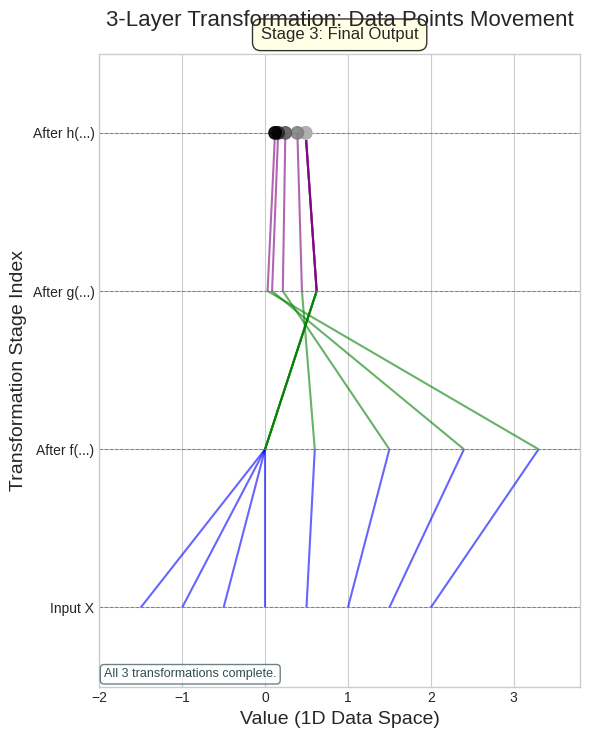

In [4]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.collections import LineCollection
from IPython.display import HTML

# Animation style settings (optional)
plt.style.use('seaborn-v0_8-whitegrid')

# ---- 1. Define Layer Transformation Building Blocks ----
def relu(x): return np.maximum(0, x)
def sigmoid(x): return 1 / (1 + np.exp(-x))
def linear_transform(x, w, b): return w * x + b
def tanh(x): return np.tanh(x)

# ---- Function to create a layer (transformation + description) ----
def create_layer(weight, bias, activation_func, activation_name, layer_name_prefix="Layer"):
    """
    Creates a layer transformation function and its description.
    Input:
        weight (float): Weight for linear transformation.
        bias (float): Bias for linear transformation.
        activation_func (callable): The activation function (e.g., relu, sigmoid).
        activation_name (str): Name of the activation function for description.
        layer_name_prefix (str): Prefix for the layer name in description (e.g., "f", "g", "h")
    Returns:
        tuple: (transform_func, description_func)
    """
    def transform(x_values):
        z = linear_transform(x_values, weight, bias)
        return activation_func(z)

    def description():
        return (f"{layer_name_prefix}(input) = {activation_name}({weight:.1f}*input + ({bias:.1f}))\n"
                f"Role: Scales, shifts, then applies {activation_name}.")
    return transform, description

# ---- 2. Define a list of layers (functions and descriptions) ----
# Each element is a tuple: (transformation_function, description_function, line_color)
layers = []
# Layer 1 (like previous 'f')
transform_f, desc_f = create_layer(weight=1.8, bias=-0.3, activation_func=relu, activation_name="ReLU", layer_name_prefix="f")
layers.append({'transform': transform_f, 'description': desc_f, 'line_color': 'blue', 'name': 'f'})

# Layer 2 (like previous 'g')
transform_g, desc_g = create_layer(weight=-1.2, bias=0.5, activation_func=sigmoid, activation_name="Sigmoid", layer_name_prefix="g")
layers.append({'transform': transform_g, 'description': desc_g, 'line_color': 'green', 'name': 'g'})

# Add more layers here if desired
# Example: Layer 3
transform_h, desc_h = create_layer(weight=0.7, bias=0.1, activation_func=tanh, activation_name="Tanh", layer_name_prefix="h")
layers.append({'transform': transform_h, 'description': desc_h, 'line_color': 'purple', 'name': 'h'})

num_layers = len(layers)
num_stages = num_layers + 1 # Input stage + one stage per layer

# ---- 3. Input Data Generation (1D points) ----
input_x_values = np.array([-1.5, -1.0, -0.5, 0.0, 0.5, 1.0, 1.5, 2.0])

# ---- 4. Pre-calculate all stage positions ----
# stage_positions[s] will hold the (N, 2) array of point positions at stage s
stage_positions = [None] * num_stages
stage_positions[0] = np.column_stack((input_x_values, np.zeros_like(input_x_values))) # Input stage (y=0)

current_values = input_x_values
for i in range(num_layers):
    layer_func = layers[i]['transform']
    current_values = layer_func(current_values)
    stage_positions[i+1] = np.column_stack((current_values, (i+1) * np.ones_like(current_values)))

# ---- 5. Plot Setup ----
fig, ax = plt.subplots(figsize=(6, 4 + num_layers * 1.5 )) # Adjust height based on num_layers
all_x_coords_plot = np.concatenate([pos[:, 0] for pos in stage_positions if pos is not None])
ax.set_xlim(all_x_coords_plot.min() - 0.5, all_x_coords_plot.max() + 0.5)
ax.set_ylim(-0.5, num_stages - 0.5)

ax.set_xlabel('Value (1D Data Space)', fontsize=14)
ax.set_ylabel('Transformation Stage Index', fontsize=14)
ax.set_yticks(np.arange(num_stages))
yticklabels = ['Input X'] + [f"After {layers[i]['name']}(...)" for i in range(num_layers)]
ax.set_yticklabels(yticklabels)
ax.set_title(f'{num_layers}-Layer Transformation: Data Points Movement', fontsize=16, pad=20)
ax.grid(True, axis='x')
for y_level in range(num_stages):
    ax.axhline(y_level, color='gray', lw=0.7, linestyle='--')

scatter_dynamic = ax.scatter([], [], s=80, alpha=0.9, cmap='viridis', zorder=3)
lines_connections = LineCollection([], alpha=0.6, linewidths=1.5, zorder=1)
ax.add_collection(lines_connections)

stage_text_obj = ax.text(0.5, 1.03, '', transform=ax.transAxes, fontsize=12,
                         ha='center', va='center', bbox=dict(boxstyle='round,pad=0.5', fc='lightyellow', alpha=0.8))
# Info text for the current layer (can be updated)
layer_info_text_obj = ax.text(0.01, 0.01, '', transform=ax.transAxes, fontsize=9, color='darkslategrey',
                               va='bottom', bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.7, ec='darkslategrey'))

point_colors_scatter = np.arange(len(input_x_values))

# ---- 6. Animation Initialization Function ----
def init():
    scatter_dynamic.set_offsets(np.empty((0, 2)))
    lines_connections.set_segments([])
    stage_text_obj.set_text('')
    layer_info_text_obj.set_text('')
    return scatter_dynamic, lines_connections, stage_text_obj, layer_info_text_obj

# ---- 7. Animation Update Function (Generalized) ----
# Timing: Distribute total_frames among stages
total_frames_animation = 100 # Base frames, will be scaled by num_layers
frames_per_show_input_or_final = int(total_frames_animation * 0.05 / (num_layers if num_layers > 0 else 1))
frames_per_transform_stage = int(total_frames_animation * 0.90 / (num_layers if num_layers > 0 else 1))
if num_layers == 0: # Handle case with no layers
    frames_per_show_input_or_final = total_frames_animation
    frames_per_transform_stage = 0

actual_total_frames = frames_per_show_input_or_final + \
                      num_layers * frames_per_transform_stage + \
                      frames_per_show_input_or_final # Add one more for final display

def update(frame_num, layers_list, all_stage_positions, num_total_stages):
    current_scatter_positions_N2 = None
    current_segments = []
    current_line_colors_list = []
    
    # Determine current overall stage and progress within that stage
    # Stage 0: Show input
    if frame_num < frames_per_show_input_or_final:
        current_scatter_positions_N2 = all_stage_positions[0]
        scatter_dynamic.set_array(point_colors_scatter)
        stage_text_obj.set_text('Stage 0: Input Data X')
        layer_info_text_obj.set_text("Initial input data points.")
        lines_connections.set_segments([])
    else:
        # Calculate which transformation stage we are in
        frame_offset = frames_per_show_input_or_final
        
        for layer_idx in range(len(layers_list)):
            start_frame_for_layer_transform = frame_offset
            end_frame_for_layer_transform = frame_offset + frames_per_transform_stage
            
            if start_frame_for_layer_transform <= frame_num < end_frame_for_layer_transform:
                # --- Currently transforming using layers_list[layer_idx] ---
                prog = (frame_num - start_frame_for_layer_transform) / \
                       (frames_per_transform_stage - 1) if frames_per_transform_stage > 1 else 1.0
                
                prev_stage_data = all_stage_positions[layer_idx]       # Data before this layer
                target_stage_data = all_stage_positions[layer_idx+1] # Data after this layer

                current_x = prev_stage_data[:, 0] * (1 - prog) + target_stage_data[:, 0] * prog
                current_y = prev_stage_data[:, 1] * (1 - prog) + target_stage_data[:, 1] * prog
                current_scatter_positions_N2 = np.column_stack((current_x, current_y))

                # Draw lines from all PREVIOUS completed transformations
                for prev_layer_i in range(layer_idx):
                    start_pts = all_stage_positions[prev_layer_i]
                    end_pts = all_stage_positions[prev_layer_i+1]
                    for i in range(len(start_pts)):
                        current_segments.append([start_pts[i], end_pts[i]])
                    current_line_colors_list.extend([layers_list[prev_layer_i]['line_color']] * len(start_pts))
                
                # Draw dynamic lines for the CURRENT transformation
                for i in range(len(prev_stage_data)):
                    current_segments.append([prev_stage_data[i], current_scatter_positions_N2[i]])
                current_line_colors_list.extend([layers_list[layer_idx]['line_color']] * len(prev_stage_data))

                stage_text_obj.set_text(f"Stage {layer_idx+1}: Applying {layers_list[layer_idx]['name']}(...)")
                layer_info_text_obj.set_text(layers_list[layer_idx]['description']())
                break # Found current layer, exit loop
            
            frame_offset = end_frame_for_layer_transform
        else: # Loop finished without break, means we are in the final display stage
            # --- Final display stage ---
            current_scatter_positions_N2 = all_stage_positions[num_total_stages-1] # Last calculated positions
            for layer_idx_final in range(len(layers_list)):
                start_pts = all_stage_positions[layer_idx_final]
                end_pts = all_stage_positions[layer_idx_final+1]
                for i in range(len(start_pts)):
                    current_segments.append([start_pts[i], end_pts[i]])
                current_line_colors_list.extend([layers_list[layer_idx_final]['line_color']] * len(start_pts))
            stage_text_obj.set_text(f"Stage {num_total_stages-1}: Final Output")
            if layers_list:
                 layer_info_text_obj.set_text(f"All {len(layers_list)} transformations complete.")
            else:
                 layer_info_text_obj.set_text("Input data shown (no transformations).")


    if current_scatter_positions_N2 is not None:
        scatter_dynamic.set_offsets(current_scatter_positions_N2)
    
    lines_connections.set_segments(current_segments)
    if current_segments:
        lines_connections.set_colors(current_line_colors_list[:len(current_segments)])

    return scatter_dynamic, lines_connections, stage_text_obj, layer_info_text_obj

# ---- 8. Create and Display Animation ----
# Use a lambda to pass additional arguments to update function if FuncAnimation doesn't allow it directly for fargs
# Or, make sure fargs is correctly used. Matplotlib's FuncAnimation's fargs takes a tuple.
ani = FuncAnimation(fig, update, frames=actual_total_frames,
                    init_func=init,
                    fargs=(layers, stage_positions, num_stages), # Pass additional arguments
                    blit=True, interval=50, repeat=False)

# Embed animation as HTML
try:
    html_output = HTML(ani.to_html5_video())
    print("Successfully generated HTML5 video for generalized layer transformation.")
except RuntimeError as e:
    print(f"RuntimeError generating HTML5 video: {e}")
    print("Falling back to JSHTML. This might take longer.")
    html_output = HTML(ani.to_jshtml())
    print("Successfully generated JSHTML for generalized layer transformation.")

fig.tight_layout(rect=[0, 0.05, 1, 0.93]) # Adjust layout slightly
html_output

/afs/cern.ch/user/t/tsano/.config/matplotlib is not a writable directory
Matplotlib created a temporary cache directory at /tmp/tsano/matplotlib-qqub0c7d because there was an issue with the default path (/afs/cern.ch/user/t/tsano/.config/matplotlib); it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Matplotlib is building the font cache; this may take a moment.
Fontconfig error: No writable cache directories
/tmp/tsano/ipykernel_2239510/1231453459.py:162: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter_rep_points = ax.scatter(


Actual total frames: 100, Rep. points: 10
Animation xlim (fixed view): [-2.0, 2.0]
RuntimeError: Requested MovieWriter (ffmpeg) not available. Check ffmpeg. Falling back to JSHTML.
Successfully generated JSHTML (fixed viewport).


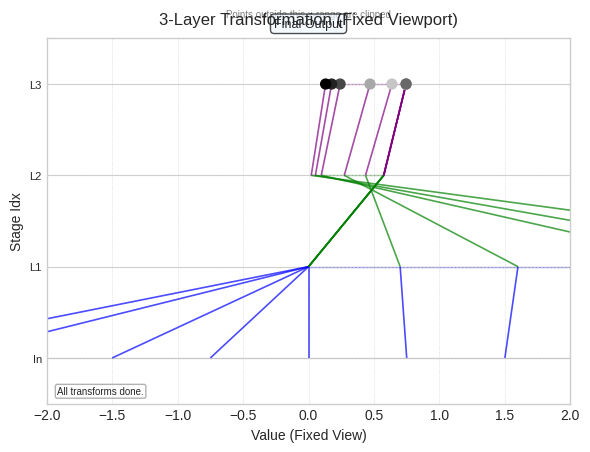

In [1]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.collections import LineCollection
from IPython.display import HTML

# Animation style settings (optional)
plt.style.use("seaborn-v0_8-whitegrid")


# ---- 1. Define Layer Transformation Building Blocks ----
def relu(x):
    return np.maximum(0, x)


def sigmoid(x):
    return 1 / (1 + np.exp(-x))


def linear_transform(x, w, b):
    return w * x + b


def tanh(x):
    return np.tanh(x)


def create_layer(
    weight, bias, activation_func, activation_name, layer_name_prefix="Layer"
):
    def transform(x_values):
        z = linear_transform(x_values, weight, bias)
        return activation_func(z)

    def description():
        return (
            f"{layer_name_prefix}(input) = {activation_name}({weight:.1f}*input + ({bias:.1f}))\n"
            f"Role: Scales, shifts, then applies {activation_name}."
        )

    return transform, description


# ---- 2. Define a list of layers ----
layers = []
transform_f, desc_f = create_layer(
    weight=1.2,
    bias=-0.2,
    activation_func=relu,
    activation_name="ReLU",
    layer_name_prefix="f",
)
layers.append(
    {"transform": transform_f, "description": desc_f, "line_color": "blue", "name": "f"}
)
transform_g, desc_g = create_layer(
    weight=-0.8,
    bias=0.3,
    activation_func=sigmoid,
    activation_name="Sigmoid",
    layer_name_prefix="g",
)
layers.append(
    {
        "transform": transform_g,
        "description": desc_g,
        "line_color": "green",
        "name": "g",
    }
)
transform_h, desc_h = create_layer(
    weight=1.5,
    bias=0.1,
    activation_func=tanh,
    activation_name="Tanh",
    layer_name_prefix="h",
)
layers.append(
    {
        "transform": transform_h,
        "description": desc_h,
        "line_color": "purple",
        "name": "h",
    }
)

num_layers = len(layers)
num_stages = num_layers + 1

# ---- 3. Input Data & High-Density Data for Background Lines ----
view_min, view_max = -2.0, 2.0  # This will be the strict xlim for the animation

representative_input_x_inside = np.linspace(view_min + 0.5, view_max - 0.5, 5)
# These points start outside the fixed view_min, view_max
representative_input_x_outside = np.array(
    [view_min - 1.5, view_min - 0.8, view_max + 0.8, view_max + 1.5, view_max + 2.5]
)
representative_input_x = np.concatenate(
    (representative_input_x_inside, representative_input_x_outside)
)
# np.random.shuffle(representative_input_x) # Optional: shuffle

# Dense line is defined more broadly, but will be clipped by xlim during plotting
dense_input_x_broader = np.linspace(view_min - 3.0, view_max + 3.0, 200)

# ---- 4. Pre-calculate all stage positions ----
rep_stage_positions = [None] * num_stages
rep_stage_positions[0] = np.column_stack(
    (representative_input_x, np.zeros_like(representative_input_x))
)
current_rep_values = representative_input_x
for i in range(num_layers):
    current_rep_values = layers[i]["transform"](current_rep_values)
    rep_stage_positions[i + 1] = np.column_stack(
        (current_rep_values, (i + 1) * np.ones_like(current_rep_values))
    )

dense_stage_data = [None] * num_stages
dense_stage_data[0] = (dense_input_x_broader, np.zeros_like(dense_input_x_broader))
current_dense_values = dense_input_x_broader
for i in range(num_layers):
    current_dense_values = layers[i]["transform"](current_dense_values)
    dense_stage_data[i + 1] = (
        current_dense_values,
        (i + 1) * np.ones_like(current_dense_values),
    )

# ---- 5. Plot Setup ----
fig_width = 6  # Back to slightly smaller width as x-range is fixed
fig_height = 2.5 + num_layers * 1.0
fig, ax = plt.subplots(figsize=(fig_width, fig_height))

# Set xlim strictly to the nominal view
ax.set_xlim(view_min, view_max)  # KEY CHANGE HERE

ax.set_ylim(-0.5, num_stages - 0.5)
ax.set_xlabel("Value (Fixed View)", fontsize=10)
ax.set_ylabel("Stage Idx", fontsize=10)
ax.set_yticks(np.arange(num_stages))
yticklabels = ["In"] + [f"L{i+1}" for i in range(num_layers)]
ax.set_yticklabels(yticklabels, fontsize=8)
ax.set_title(f"{num_layers}-Layer Transformation (Fixed Viewport)", fontsize=12, pad=10)
ax.grid(True, axis="x", linestyle=":", linewidth=0.5)
for y_level in range(num_stages):
    ax.axhline(y_level, color="lightgray", lw=0.5, linestyle="--")

# No need for ax.fill_betweenx for nominal view as xlim IS the nominal view.
# Optional: Add text to indicate that some points might be outside this view.
ax.text(
    0.5,
    1.08,
    "Points outside this x-range are clipped",
    transform=ax.transAxes,
    ha="center",
    va="top",
    fontsize=7,
    color="gray",
)


scatter_rep_points = ax.scatter(
    [], [], s=50, alpha=1.0, cmap="cool", zorder=4, clip_on=True
)  # clip_on=True is default but explicit
lines_rep_connections = LineCollection(
    [], alpha=0.7, linewidths=1.2, zorder=2, clip_on=True
)
ax.add_collection(lines_rep_connections)

background_lines = []
bg_line_colors = ["darkgray"] + [layer["line_color"] for layer in layers]
for i in range(num_stages):
    (line,) = ax.plot(
        [], [], lw=1.0, alpha=0.35, color=bg_line_colors[i], zorder=1, clip_on=True
    )
    background_lines.append(line)

stage_text_obj = ax.text(
    0.5,
    1.04,
    "",
    transform=ax.transAxes,
    fontsize=9,
    ha="center",
    va="center",
    bbox=dict(boxstyle="round,pad=0.3", fc="aliceblue", alpha=0.7),
)
layer_info_text_obj = ax.text(
    0.02,
    0.02,
    "",
    transform=ax.transAxes,
    fontsize=7,
    va="bottom",
    linespacing=1.2,
    bbox=dict(boxstyle="round,pad=0.2", fc="white", alpha=0.6, ec="grey"),
)

rep_point_colors_scatter = np.arange(len(representative_input_x))


# ---- 6. Animation Initialization Function ----
def init():
    scatter_rep_points.set_offsets(np.empty((0, 2)))
    lines_rep_connections.set_segments([])
    for bg_line in background_lines:
        bg_line.set_data([], [])
    stage_text_obj.set_text("")
    layer_info_text_obj.set_text("")
    # Ensure artists are returned for blitting
    artists = [
        scatter_rep_points,
        lines_rep_connections,
        stage_text_obj,
        layer_info_text_obj,
    ]
    artists.extend(background_lines)
    return artists


# ---- 7. Animation Update Function (Generalized) ----
desired_total_frames = 100
if num_layers > 0:
    frames_for_start_end_each = max(1, int(desired_total_frames * 0.05))
    frames_for_all_transforms = desired_total_frames - 2 * frames_for_start_end_each
    frames_per_transform_stage = max(1, frames_for_all_transforms // num_layers)
    actual_total_frames = (
        2 * frames_for_start_end_each + num_layers * frames_per_transform_stage
    )
else:
    frames_for_start_end_each = desired_total_frames // 2
    frames_per_transform_stage = 0
    actual_total_frames = 2 * frames_for_start_end_each


def update(
    frame_num,
    layers_list,
    all_rep_stage_positions,
    all_dense_stage_data,
    num_total_stages,
):
    current_scatter_positions_N2 = None
    current_rep_segments = []
    current_rep_line_colors_list = []

    frames_show_input = frames_for_start_end_each
    frames_show_final_start = actual_total_frames - frames_for_start_end_each

    completed_stages_for_bg = 0
    if frame_num < frames_show_input:
        completed_stages_for_bg = 1
    else:
        temp_frame_offset = frames_show_input
        completed_stages_for_bg = 1
        for layer_idx_bg in range(len(layers_list)):
            if frame_num >= temp_frame_offset + frames_per_transform_stage:
                completed_stages_for_bg += 1
                temp_frame_offset += frames_per_transform_stage
            else:
                break
        if frame_num >= frames_show_final_start:
            completed_stages_for_bg = num_total_stages

    for i in range(num_total_stages):
        if i < completed_stages_for_bg:
            x_dense, y_level_dense = all_dense_stage_data[i]
            sort_indices = np.argsort(x_dense)
            background_lines[i].set_data(
                x_dense[sort_indices], y_level_dense[sort_indices]
            )
        else:
            background_lines[i].set_data([], [])

    if frame_num < frames_show_input:
        current_scatter_positions_N2 = all_rep_stage_positions[0]
        scatter_rep_points.set_array(rep_point_colors_scatter)
        stage_text_obj.set_text("Input X")
        layer_info_text_obj.set_text("Initial data (some outside fixed view).")
        lines_rep_connections.set_segments([])
    elif frame_num >= frames_show_final_start:
        current_scatter_positions_N2 = all_rep_stage_positions[num_total_stages - 1]
        for layer_idx_final in range(len(layers_list)):
            start_pts, end_pts = (
                all_rep_stage_positions[layer_idx_final],
                all_rep_stage_positions[layer_idx_final + 1],
            )
            for i in range(len(start_pts)):
                current_rep_segments.append([start_pts[i], end_pts[i]])
            current_rep_line_colors_list.extend(
                [layers_list[layer_idx_final]["line_color"]] * len(start_pts)
            )
        stage_text_obj.set_text(f"Final Output")
        layer_info_text_obj.set_text(f"All transforms done.")
    else:
        frame_offset = frames_show_input
        for layer_idx in range(len(layers_list)):
            start_frame, end_frame = (
                frame_offset,
                frame_offset + frames_per_transform_stage,
            )
            if start_frame <= frame_num < end_frame:
                prog = (
                    (frame_num - start_frame) / (frames_per_transform_stage - 1)
                    if frames_per_transform_stage > 1
                    else 1.0
                )
                prev_pts, target_pts = (
                    all_rep_stage_positions[layer_idx],
                    all_rep_stage_positions[layer_idx + 1],
                )
                current_x = prev_pts[:, 0] * (1 - prog) + target_pts[:, 0] * prog
                current_y = prev_pts[:, 1] * (1 - prog) + target_pts[:, 1] * prog
                current_scatter_positions_N2 = np.column_stack((current_x, current_y))

                for prev_i in range(layer_idx):
                    s_pts, e_pts = (
                        all_rep_stage_positions[prev_i],
                        all_rep_stage_positions[prev_i + 1],
                    )
                    for i in range(len(s_pts)):
                        current_rep_segments.append([s_pts[i], e_pts[i]])
                    current_rep_line_colors_list.extend(
                        [layers_list[prev_i]["line_color"]] * len(s_pts)
                    )

                for i in range(len(prev_pts)):
                    current_rep_segments.append(
                        [prev_pts[i], current_scatter_positions_N2[i]]
                    )
                current_rep_line_colors_list.extend(
                    [layers_list[layer_idx]["line_color"]] * len(prev_pts)
                )

                stage_text_obj.set_text(
                    f"Transforming: {layers_list[layer_idx]['name']}(...)"
                )
                layer_info_text_obj.set_text(layers_list[layer_idx]["description"]())
                break
            frame_offset = end_frame

    if current_scatter_positions_N2 is not None:
        scatter_rep_points.set_offsets(current_scatter_positions_N2)
    lines_rep_connections.set_segments(current_rep_segments)
    if current_rep_segments:
        lines_rep_connections.set_colors(
            current_rep_line_colors_list[: len(current_rep_segments)]
        )

    # Ensure artists are returned for blitting
    artists = [
        scatter_rep_points,
        lines_rep_connections,
        stage_text_obj,
        layer_info_text_obj,
    ]
    artists.extend(background_lines)
    return artists


# ---- 8. Create and Display Animation ----
ani = FuncAnimation(
    fig,
    update,
    frames=actual_total_frames,
    init_func=init,
    fargs=(layers, rep_stage_positions, dense_stage_data, num_stages),
    blit=True,
    interval=max(20, 1000 // (actual_total_frames / 2.5)),
    repeat=False,
)

print(
    f"Actual total frames: {actual_total_frames}, Rep. points: {len(representative_input_x)}"
)
print(f"Animation xlim (fixed view): [{view_min:.1f}, {view_max:.1f}]")


try:
    html_output = HTML(ani.to_html5_video())
    print("Successfully generated HTML5 video (fixed viewport).")
except RuntimeError as e:
    print(f"RuntimeError: {e}. Check ffmpeg. Falling back to JSHTML.")
    html_output = HTML(ani.to_jshtml())
    print("Successfully generated JSHTML (fixed viewport).")

fig.tight_layout(rect=[0, 0.05, 1, 0.90])  # Adjusted rect for text
html_output

In [ ]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.collections import LineCollection
from IPython.display import HTML, display # Ensure display is imported
from collections import namedtuple

# Animation style settings (optional)
plt.style.use('seaborn-v0_8-whitegrid')

# ---- 1. Core Transformation Logic & Layer Definition ----
def relu(x): return np.maximum(0, x)
def sigmoid(x): return 1 / (1 + np.exp(-x))
def linear_transform(x, w, b): return w * x + b
def tanh(x): return np.tanh(x)

class Layer:
    def __init__(self, weight, bias, activation_func, activation_name, name, line_color):
        self.weight = weight
        self.bias = bias
        self.activation_func = activation_func
        self.activation_name = activation_name
        self.name = name
        self.line_color = line_color

    def transform(self, x_values):
        z = linear_transform(x_values, self.weight, self.bias)
        return self.activation_func(z)

    def get_description(self):
        return (f"{self.name}(input) = {self.activation_name}({self.weight:.1f}*input + ({self.bias:.1f}))\n"
                f"Role: Scales, shifts, then applies {self.activation_name}.")

# StageData to hold data for each stage
StageProcessedData = namedtuple('StageProcessedData', ['rep_points_xy', 'dense_x', 'dense_y_level'])


# ---- 2. Animation Configuration & Data Preparation ----
def setup_layers_and_data():
    """Configures layers, input data, and pre-calculates stage data."""
    layers_config = [
        Layer(weight=1.2, bias=-0.2, activation_func=relu, activation_name="ReLU", name="f", line_color='blue'),
        Layer(weight=-0.8, bias=0.3, activation_func=sigmoid, activation_name="Sigmoid", name="g", line_color='green'),
        Layer(weight=1.5, bias=0.1, activation_func=tanh, activation_name="Tanh", name="h", line_color='purple')
    ]
    num_layers = len(layers_config)
    num_stages = num_layers + 1

    view_min, view_max = -2.0, 2.0

    rep_input_x_inside = np.linspace(view_min + 0.5, view_max - 0.5, 5)
    rep_input_x_outside = np.array([view_min - 1.5, view_min - 0.8, view_max + 0.8, view_max + 1.5, view_max + 2.5])
    rep_input_x = np.concatenate((rep_input_x_inside, rep_input_x_outside))
    # np.random.shuffle(rep_input_x) # Optional

    dense_input_x_broader = np.linspace(view_min - 3.0, view_max + 3.0, 200)

    all_stage_data = [None] * num_stages
    all_stage_data[0] = StageProcessedData(
        rep_points_xy=np.column_stack((rep_input_x, np.zeros_like(rep_input_x))),
        dense_x=dense_input_x_broader,
        dense_y_level=np.zeros_like(dense_input_x_broader)
    )

    current_rep_values = rep_input_x
    current_dense_values = dense_input_x_broader
    for i in range(num_layers):
        layer = layers_config[i]
        current_rep_values = layer.transform(current_rep_values)
        current_dense_values = layer.transform(current_dense_values)
        all_stage_data[i+1] = StageProcessedData(
            rep_points_xy=np.column_stack((current_rep_values, (i+1) * np.ones_like(current_rep_values))),
            dense_x=current_dense_values,
            dense_y_level=(i+1) * np.ones_like(current_dense_values)
        )
    
    return layers_config, all_stage_data, view_min, view_max, num_stages, len(rep_input_x)

# ---- 3. Plotting Elements Setup ----
class PlotElements:
    def __init__(self, ax, num_stages, num_rep_points, layers_config_list): # Renamed layers_config for clarity
        self.ax = ax
        self.scatter_rep_points = ax.scatter([], [], s=50, alpha=1.0, cmap='cool', zorder=4, clip_on=True)
        self.lines_rep_connections = LineCollection([], alpha=0.7, linewidths=1.2, zorder=2, clip_on=True)
        ax.add_collection(self.lines_rep_connections)

        self.background_lines = []
        bg_line_colors = ['darkgray'] + [layer.line_color for layer in layers_config_list]
        for i in range(num_stages):
            line, = ax.plot([], [], lw=1.0, alpha=0.35, color=bg_line_colors[i], zorder=1, clip_on=True)
            self.background_lines.append(line)

        self.stage_text_obj = ax.text(0.5, 1.04, '', transform=ax.transAxes, fontsize=9,
                                      ha='center', va='center', bbox=dict(boxstyle='round,pad=0.3', fc='aliceblue', alpha=0.7))
        self.layer_info_text_obj = ax.text(0.02, 0.02, '', transform=ax.transAxes, fontsize=7,
                                           va='bottom', linespacing=1.2,
                                           bbox=dict(boxstyle='round,pad=0.2', fc='white', alpha=0.6, ec='grey'))
        self.rep_point_colors_scatter = np.arange(num_rep_points)

    def get_artists(self):
        artists = [self.scatter_rep_points, self.lines_rep_connections,
                   self.stage_text_obj, self.layer_info_text_obj]
        artists.extend(self.background_lines)
        return artists

    def reset(self):
        self.scatter_rep_points.set_offsets(np.empty((0, 2)))
        self.lines_rep_connections.set_segments([])
        for bg_line in self.background_lines:
            bg_line.set_data([], [])
        self.stage_text_obj.set_text('')
        self.layer_info_text_obj.set_text('')

# ---- 4. Animation Timing and Control ----
class AnimationStateManager:
    def __init__(self, desired_total_frames, num_layers):
        self.num_layers = num_layers
        if num_layers > 0:
            self.frames_show_input = max(1, int(desired_total_frames * 0.05))
            self.frames_show_final = self.frames_show_input
            frames_for_all_transforms = desired_total_frames - self.frames_show_input - self.frames_show_final
            self.frames_per_transform_stage = max(1, frames_for_all_transforms // num_layers)
            self.actual_total_frames = self.frames_show_input + \
                                       num_layers * self.frames_per_transform_stage + \
                                       self.frames_show_final
        else:
            self.frames_show_input = desired_total_frames // 2
            self.frames_show_final = desired_total_frames - self.frames_show_input
            self.frames_per_transform_stage = 0
            self.actual_total_frames = self.frames_show_input + self.frames_show_final
        
        print(f"AnimationStateManager Initialized:")
        print(f"  Actual total frames: {self.actual_total_frames}")
        print(f"  Frames for input display: {self.frames_show_input}")
        print(f"  Frames per transform stage: {self.frames_per_transform_stage}")
        print(f"  Frames for final display: {self.frames_show_final}")

    def get_current_stage_info(self, frame_num):
        if frame_num < self.frames_show_input:
            return "input", 0, 0.0
        if frame_num >= self.actual_total_frames - self.frames_show_final:
            return "final", self.num_layers -1 , 1.0
        current_frame_in_transforms = frame_num - self.frames_show_input
        layer_idx = current_frame_in_transforms // self.frames_per_transform_stage
        progress_in_layer = (current_frame_in_transforms % self.frames_per_transform_stage) / \
                            (self.frames_per_transform_stage -1) if self.frames_per_transform_stage > 1 else 1.0
        return "transform", layer_idx, progress_in_layer

# ---- 5. Main Animation Update Logic ----
def animate_update(frame_num, plot_elements_instance, anim_state_manager_instance, layers_config_list, all_stage_data_list, num_total_stages_val):
    # Renamed fargs for clarity within the function
    phase, current_layer_idx, progress = anim_state_manager_instance.get_current_stage_info(frame_num)
    
    current_scatter_pos = None
    rep_segments = []
    rep_line_colors = []

    completed_stages_for_bg = 0
    if phase == "input": completed_stages_for_bg = 1
    elif phase == "final": completed_stages_for_bg = num_total_stages_val
    elif phase == "transform":
        completed_stages_for_bg = current_layer_idx + 1
    
    for i in range(num_total_stages_val):
        if i < completed_stages_for_bg:
            dense_x, dense_y_level = all_stage_data_list[i].dense_x, all_stage_data_list[i].dense_y_level
            sort_indices = np.argsort(dense_x)
            plot_elements_instance.background_lines[i].set_data(dense_x[sort_indices], dense_y_level[sort_indices])
        else:
            plot_elements_instance.background_lines[i].set_data([], [])

    if phase == "input":
        current_scatter_pos = all_stage_data_list[0].rep_points_xy
        plot_elements_instance.scatter_rep_points.set_array(plot_elements_instance.rep_point_colors_scatter)
        plot_elements_instance.stage_text_obj.set_text('Input X')
        plot_elements_instance.layer_info_text_obj.set_text("Initial data (some outside fixed view).")
        plot_elements_instance.lines_rep_connections.set_segments([])
    
    elif phase == "final":
        current_scatter_pos = all_stage_data_list[num_total_stages_val-1].rep_points_xy
        for i in range(len(layers_config_list)):
            start_pts = all_stage_data_list[i].rep_points_xy
            end_pts = all_stage_data_list[i+1].rep_points_xy
            for k in range(len(start_pts)): rep_segments.append([start_pts[k], end_pts[k]])
            rep_line_colors.extend([layers_config_list[i].line_color] * len(start_pts))
        plot_elements_instance.stage_text_obj.set_text(f"Final Output")
        plot_elements_instance.layer_info_text_obj.set_text(f"All {len(layers_config_list)} transforms done.")

    elif phase == "transform":
        prev_pts_data = all_stage_data_list[current_layer_idx].rep_points_xy
        target_pts_data = all_stage_data_list[current_layer_idx+1].rep_points_xy
        current_x = prev_pts_data[:, 0] * (1-progress) + target_pts_data[:, 0] * progress
        current_y = prev_pts_data[:, 1] * (1-progress) + target_pts_data[:, 1] * progress
        current_scatter_pos = np.column_stack((current_x, current_y))
        for i in range(current_layer_idx):
            start_pts = all_stage_data_list[i].rep_points_xy
            end_pts = all_stage_data_list[i+1].rep_points_xy
            for k in range(len(start_pts)): rep_segments.append([start_pts[k], end_pts[k]])
            rep_line_colors.extend([layers_config_list[i].line_color] * len(start_pts))
        for i in range(len(prev_pts_data)):
            rep_segments.append([prev_pts_data[i], current_scatter_pos[i]])
        rep_line_colors.extend([layers_config_list[current_layer_idx].line_color] * len(prev_pts_data))
        plot_elements_instance.stage_text_obj.set_text(f"Transforming: {layers_config_list[current_layer_idx].name}(...)")
        plot_elements_instance.layer_info_text_obj.set_text(layers_config_list[current_layer_idx].get_description())

    if current_scatter_pos is not None:
        plot_elements_instance.scatter_rep_points.set_offsets(current_scatter_pos)
    plot_elements_instance.lines_rep_connections.set_segments(rep_segments)
    if rep_segments:
        plot_elements_instance.lines_rep_connections.set_colors(rep_line_colors[:len(rep_segments)])
    return plot_elements_instance.get_artists()

# ---- Code to be run in a Jupyter Cell ----

# 1. Setup data and configurations
layers_c, all_s_data, v_min, v_max, num_s, num_r_points = setup_layers_and_data()

# 2. Create Figure and Axes
fig_w = 6
fig_h = 2.5 + len(layers_c) * 1.0
fig, ax = plt.subplots(figsize=(fig_w, fig_h))

# 3. Configure Axes
ax.set_xlim(v_min, v_max)
ax.set_ylim(-0.5, num_s - 0.5)
ax.set_xlabel('Value (Fixed View)', fontsize=10)
ax.set_ylabel('Stage Idx', fontsize=10)
ax.set_yticks(np.arange(num_s))
yticklabels = ['In'] + [f"L{i+1}" for i in range(len(layers_c))]
ax.set_yticklabels(yticklabels, fontsize=8)
ax.set_title(f'{len(layers_c)}-Layer Transformation (Fixed Viewport)', fontsize=12, pad=10)
ax.grid(True, axis='x', linestyle=':', linewidth=0.5)
for y_level_ax in range(num_s): # Renamed y_level to avoid conflict
    ax.axhline(y_level_ax, color='lightgray', lw=0.5, linestyle='--')
ax.text(0.5, 1.08, 'Points outside x-range are clipped', transform=ax.transAxes,
        ha='center', va='top', fontsize=7, color='gray')

# 4. Create Plotting Elements and Animation State Manager
plot_elems = PlotElements(ax, num_s, num_r_points, layers_c)
anim_manager = AnimationStateManager(desired_total_frames=100, num_layers=len(layers_c))

# 5. Define init function for animation
def init_animation_func(): # Renamed to avoid conflict
    plot_elems.reset()
    return plot_elems.get_artists()

# 6. Create Animation
# Note: fargs parameters must match the order in animate_update after frame_num
animation = FuncAnimation(fig, animate_update, frames=anim_manager.actual_total_frames,
                        init_func=init_animation_func,
                        fargs=(plot_elems, anim_manager, layers_c, all_s_data, num_s),
                        blit=True, interval=max(20, 1000 // (anim_manager.actual_total_frames / 2.5)),
                        repeat=False)

print(f"Representative points: {num_r_points}")
print(f"Animation xlim (fixed view): [{v_min:.1f}, {v_max:.1f}]")

# 7. Display Animation
# Closing the static plot that might appear before animation if not in interactive mode
plt.close(fig) # Close the static plot from plt.subplots()

try:
    html_video = HTML(animation.to_html5_video())
    print("Successfully generated HTML5 video (refactored for Jupyter).")
    display(html_video)
except RuntimeError as e:
    print(f"RuntimeError: {e}. Check ffmpeg. Falling back to JSHTML.")
    # Ensure any previous figure is closed if to_html5_video failed early
    # plt.close(fig) # Might be redundant if already closed, or if error was very early
    html_js = HTML(animation.to_jshtml())
    print("Successfully generated JSHTML (refactored for Jupyter).")
    display(html_js)

# fig.tight_layout(rect=[0, 0.05, 1, 0.90]) # Apply tight_layout after animation object created.
# This line might cause issues if `fig` was closed.
# If you need tight_layout, apply it before `plt.close(fig)` or ensure `fig` is still valid.
# For now, removing it to ensure display works, as layout is generally okay.